In [71]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


Data Clearing Has Already Been Done With SSIS

In [72]:
data=pd.read_csv('/content/sample_data/Data.csv')
df = pd.DataFrame(data)

In [73]:
df=df.drop(['CustomerKey','InvoiceNumber','Fee','Price','AdditionAmount','ReductionAmount','Tax','VolumeSalesNetWeight_Kg','VolumeSalesGrossWeight_Kg','GrossPrice_Toman'
,'NetPrice_Toman','DollarPrice','GrossPrice_Dollar','Weight','WeghtUnit','NetPrice_Dollar'], axis=1)

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 326224 entries, 0 to 326223
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   PersianYearInt       326224 non-null  int64  
 1   PersianMonthNo       326224 non-null  int64  
 2   PersianDayInMonth    326224 non-null  int64  
 3   PersianStr           326224 non-null  object 
 4   ProductKey           325987 non-null  float64
 5   InvoiceItemQuantity  326224 non-null  int64  
 6   NetPrice             326224 non-null  float64
dtypes: float64(2), int64(4), object(1)
memory usage: 17.4+ MB


In [75]:
df=df.dropna()

df['PersianYearInt'] = df['PersianYearInt'].astype('int16')
df['PersianMonthNo'] = df['PersianMonthNo'].astype('int8')
df['PersianDayInMonth'] = df['PersianDayInMonth'].astype('int8')
df['ProductKey'] = df['ProductKey'].astype('int32')
df['InvoiceItemQuantity'] = df['InvoiceItemQuantity'].astype('int16')
df['NetPrice'] = df['NetPrice'].astype('float32')



df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 325987 entries, 0 to 326223
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   PersianYearInt       325987 non-null  int16  
 1   PersianMonthNo       325987 non-null  int8   
 2   PersianDayInMonth    325987 non-null  int8   
 3   PersianStr           325987 non-null  object 
 4   ProductKey           325987 non-null  int32  
 5   InvoiceItemQuantity  325987 non-null  int16  
 6   NetPrice             325987 non-null  float32
dtypes: float32(1), int16(2), int32(1), int8(2), object(1)
memory usage: 9.3+ MB


In [76]:
#df = df[df['PersianYearInt']==1403]
df

,PersianYearInt,PersianMonthNo,PersianDayInMonth,PersianStr,ProductKey,InvoiceItemQuantity,NetPrice
0,1400,5,3,1400/05/03,684,48,45517736.0
1,1402,5,22,1402/05/22,113,30,229893616.0
2,1400,7,20,1400/07/20,147,8,45315172.0
3,1400,10,9,1400/10/09,494,12,38602064.0
4,1399,8,11,1399/08/11,550,8,46734716.0
...,...,...,...,...,...,...,...
326219,1398,5,14,1398/05/14,540,5,17765738.0
326220,1399,9,16,1399/09/16,545,8,46734716.0
326221,1402,2,20,1402/02/20,644,11,115343536.0
326222,1400,3,6,1400/03/06,86,50,122496400.0


In [77]:
yearly_sales = df.groupby('PersianYearInt')['NetPrice'].sum().reset_index()

fig = px.bar(yearly_sales, x='PersianYearInt', y='NetPrice', title='Total Sales by Year')
fig.show()

In [78]:
monthly_sales = df.groupby('PersianMonthNo')['NetPrice'].sum().reset_index()

fig = px.bar(monthly_sales, x='PersianMonthNo', y='NetPrice', title='Total Sales by Month')
fig.show()

In [79]:
import jdatetime

def persian_to_gregorian(persian_date_str):
    year, month, day = map(int, persian_date_str.split('/'))
    jalali_date = jdatetime.date(year, month, day)
    return jalali_date.togregorian()
df['GregorianDate'] = df['PersianStr'].apply(persian_to_gregorian)
df['GregorianDate'] = pd.to_datetime(df['GregorianDate'])
daily_sales = df.groupby('GregorianDate')['NetPrice'].sum().reset_index()


import plotly.express as px
fig = px.line(daily_sales, x='GregorianDate', y='NetPrice', title='Sales Trend Over Time')
fig.show()

In [80]:
product_sales = df.groupby('ProductKey')['NetPrice'].sum().reset_index()

top_products = product_sales.sort_values(by='NetPrice', ascending=False).head(10)

fig = px.bar(top_products, x='ProductKey', y='NetPrice', title='Top 10 Products by Sales')

fig.show()

In [81]:
year_data = df[df['PersianYearInt'] == 1403]

monthly_sales_year = year_data.groupby('PersianMonthNo')['NetPrice'].sum().reset_index()

fig = px.line(monthly_sales_year, x='PersianMonthNo', y='NetPrice', title='Monthly Sales for Year 1403')

fig.update_xaxes(tickvals=list(range(1, 13)))
fig.show()

In [82]:
year_data = df[df['PersianYearInt'] == 1403]

daily_sales = year_data.groupby(['PersianMonthNo', 'PersianDayInMonth'])['NetPrice'].sum().reset_index()

fig = px.line(daily_sales,
              x='PersianDayInMonth',
              y='NetPrice',
              color='PersianMonthNo',
              title='Daily Sales for Each Month in Year 1403',
              labels={'PersianDayInMonth': 'Day of Month', 'NetPrice': 'Total Sales', 'PersianMonthNo': 'Month'})

fig.update_xaxes(tickvals=list(range(1, 32)))
fig.show()

In [83]:
monthly_sales = df.groupby(['PersianYearInt', 'PersianMonthNo'])['NetPrice'].sum().reset_index()

fig = px.line(monthly_sales,
              x='PersianMonthNo',
              y='NetPrice',
              color='PersianYearInt',
              title='Monthly Sales for Each Year',
              labels={'PersianMonthNo': 'Month', 'NetPrice': 'Total Sales', 'PersianYearInt': 'Year'}  )

fig.update_xaxes(tickvals=list(range(1, 13)))

fig.show()


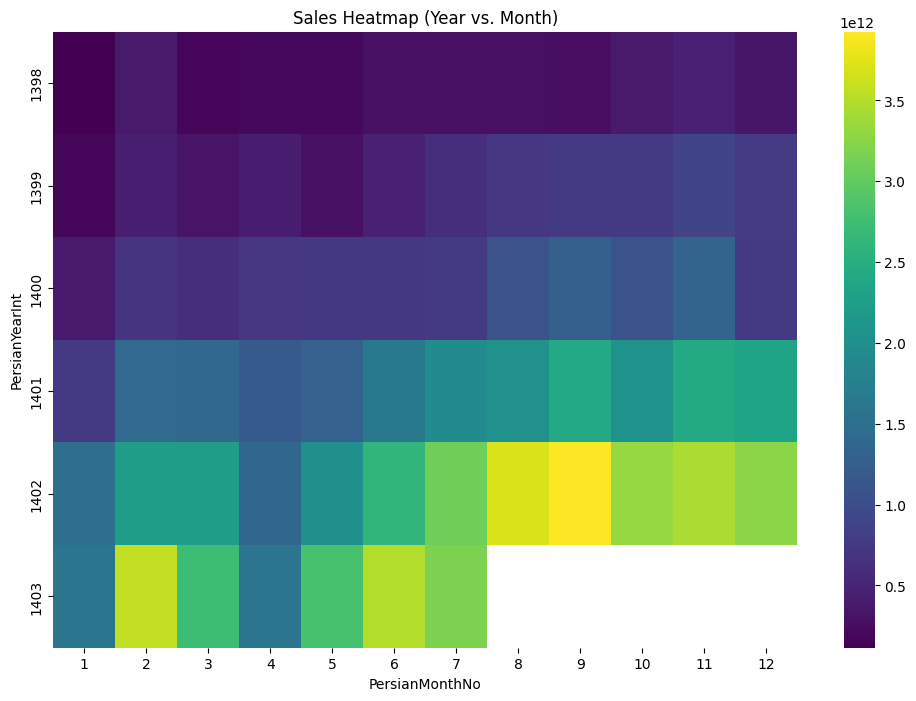

In [84]:
heatmap_data = df.groupby(['PersianYearInt', 'PersianMonthNo'])['NetPrice'].sum().unstack()

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis')
plt.title('Sales Heatmap (Year vs. Month)')
plt.show()

In [85]:
fig = px.scatter(df,
                 x='InvoiceItemQuantity',
                 y='NetPrice',
                 title='Quantity vs. NetPrice',
                 trendline='ols')
fig.show()

In [86]:
monthly_product_sales = df.groupby(['PersianYearInt', 'PersianMonthNo', 'ProductKey']).agg(
    TotalNetPrice=('NetPrice', 'sum'),
    TotalQuantity=('InvoiceItemQuantity', 'sum')
).reset_index()

best_selling_products = monthly_product_sales.loc[
    monthly_product_sales.groupby(['PersianYearInt', 'PersianMonthNo'])['TotalNetPrice'].idxmax()
]

print(best_selling_products[['PersianYearInt', 'PersianMonthNo', 'ProductKey', 'TotalNetPrice', 'TotalQuantity']])

      PersianYearInt  PersianMonthNo  ProductKey  TotalNetPrice  TotalQuantity
76              1398               1         687   1.532686e+10          37206
158             1398               2         687   3.558185e+10          85622
249             1398               3         687   2.250357e+10          48348
338             1398               4         687   2.361830e+10          54168
433             1398               5         687   2.649047e+10          65249
...              ...             ...         ...            ...            ...
7114            1403               3         677   5.814952e+11         190827
7221            1403               4         677   5.502990e+11         168194
7332            1403               5         677   8.222194e+11         251306
7438            1403               6         677   8.995446e+11         274929
7545            1403               7         677   1.020745e+12         311977

[67 rows x 5 columns]


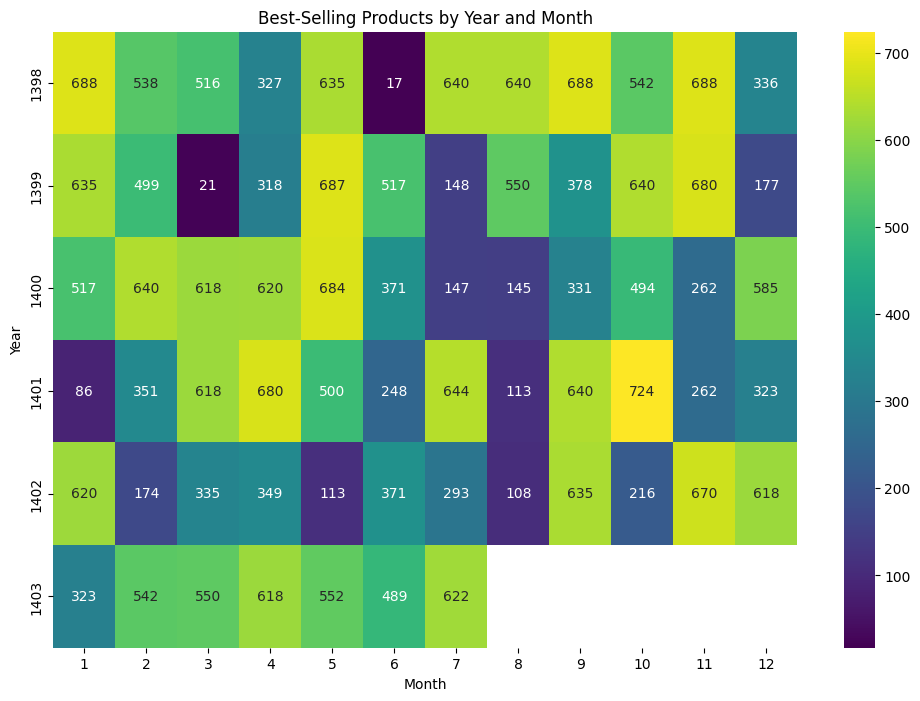

In [87]:
 heatmap_data = df.pivot_table(
    index='PersianYearInt',
    columns='PersianMonthNo',
    values='ProductKey',
    aggfunc='first'
)

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis', annot=True, fmt='.0f')
plt.title('Best-Selling Products by Year and Month')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()

In [88]:
fig = px.scatter(best_selling_products,
                 x='PersianMonthNo',
                 y='TotalNetPrice',
                 size='TotalQuantity',
                 color='TotalNetPrice',
                 facet_col='PersianYearInt',
                 title='Sales Volume and Quantity Sold for Best-Selling Products',
                 labels={'PersianMonthNo': 'Month', 'TotalNetPrice': 'Sales Volume', 'TotalQuantity': 'Quantity Sold'})
fig.show()

In [89]:
from khayyam import JalaliDate

def persian_to_gregorian(persian_date_str):
    year, month, day = map(int, persian_date_str.split('/'))
    jalali_date = JalaliDate(year, month, day)
    return jalali_date.todate()

df['GregorianDate'] = df['PersianStr'].apply(persian_to_gregorian)

df['GregorianDate'] = pd.to_datetime(df['GregorianDate'])

df['DayOfWeek'] = df['GregorianDate'].dt.day_name()

print(df[['PersianStr', 'GregorianDate', 'DayOfWeek']].head())

   PersianStr GregorianDate DayOfWeek
0  1400/05/03    2021-07-25    Sunday
1  1402/05/22    2023-08-13    Sunday
2  1400/07/20    2021-10-12   Tuesday
3  1400/10/09    2021-12-30  Thursday
4  1399/08/11    2020-11-01    Sunday


In [90]:
monthly_sales = df.groupby(['PersianYearInt', 'PersianMonthNo'])['NetPrice'].sum().reset_index()

monthly_sales['GrowthRate'] = monthly_sales['NetPrice'].pct_change() * 100

fig = px.line(monthly_sales,
              x='PersianMonthNo',
              y='GrowthRate',
              color='PersianYearInt',
              title='Monthly Sales Growth Rate',
              labels={'PersianMonthNo': 'Month', 'GrowthRate': 'Growth Rate (%)'})

fig.update_layout(
    xaxis=dict(tickvals=list(range(1, 13))))
fig.show()

In [91]:
def persian_to_gregorian(persian_date_str):
    year, month, day = map(int, persian_date_str.split('/'))
    jalali_date = jdatetime.date(year, month, day)
    return jalali_date.togregorian()

df['GregorianDate'] = df['PersianStr'].apply(persian_to_gregorian)

df['GregorianDate'] = pd.to_datetime(df['GregorianDate'])

top_products = df.groupby('ProductKey')['NetPrice'].sum().nlargest(5).reset_index()['ProductKey']

top_products_data = df[df['ProductKey'].isin(top_products)]

cumulative_sales = top_products_data.groupby(['GregorianDate', 'ProductKey'])['NetPrice'].sum().reset_index()

cumulative_sales['CumulativeSales'] = cumulative_sales.groupby('ProductKey')['NetPrice'].cumsum()

fig = px.line(cumulative_sales,
              x='GregorianDate',
              y='CumulativeSales',
              color='ProductKey',
              title='Cumulative Sales for Top Products')
fig.show()

In [92]:
product_sales_quantity = df.groupby('ProductKey').agg(
    TotalNetPrice=('NetPrice', 'sum'),
    TotalQuantity=('InvoiceItemQuantity', 'sum')
).reset_index()

fig = px.scatter(product_sales_quantity,
                 x='TotalQuantity',
                 y='TotalNetPrice',
                 size='TotalNetPrice',
                 color='ProductKey',
                 title='Sales vs. Quantity Sold',
                 labels={'TotalQuantity': 'Quantity Sold', 'TotalNetPrice': 'Sales Volume'})
fig.show()

In [93]:
df_1403=  df[df['PersianYearInt']==1403]
df_1403=  df[df['ProductKey']==677]

fig = px.box(df_1403, y='InvoiceItemQuantity', title='Box Plot of InvoiceItemQuantity to Identify Outliers')

fig.show()

In [94]:
fig = px.scatter(df_1403, x='InvoiceItemQuantity', y='NetPrice', color='ProductKey',
                 title='Scatter Plot: NetPrice vs InvoiceItemQuantity')
fig.show()

In [95]:
fig = px.histogram(df_1403, x='NetPrice', nbins=30, title='Histogram of NetPrice')
fig.show()

In [96]:
fig = px.scatter_3d(df_1403, x='InvoiceItemQuantity', y='NetPrice', z='ProductKey',
                    color='ProductKey', title='3D Scatter Plot')
fig.show()

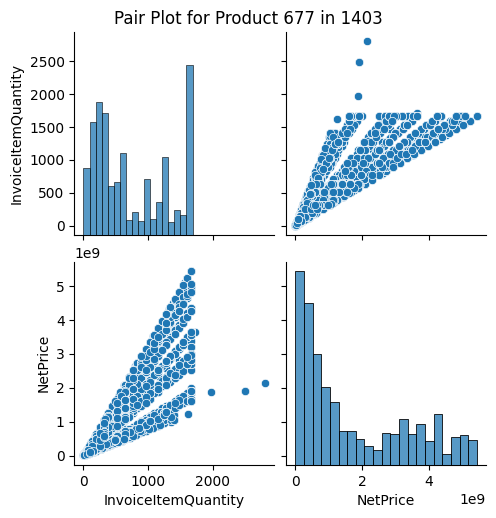

In [97]:
sns.pairplot(df_1403[['InvoiceItemQuantity', 'NetPrice']])
plt.suptitle('Pair Plot for Product 677 in 1403', y=1.02)
plt.show()

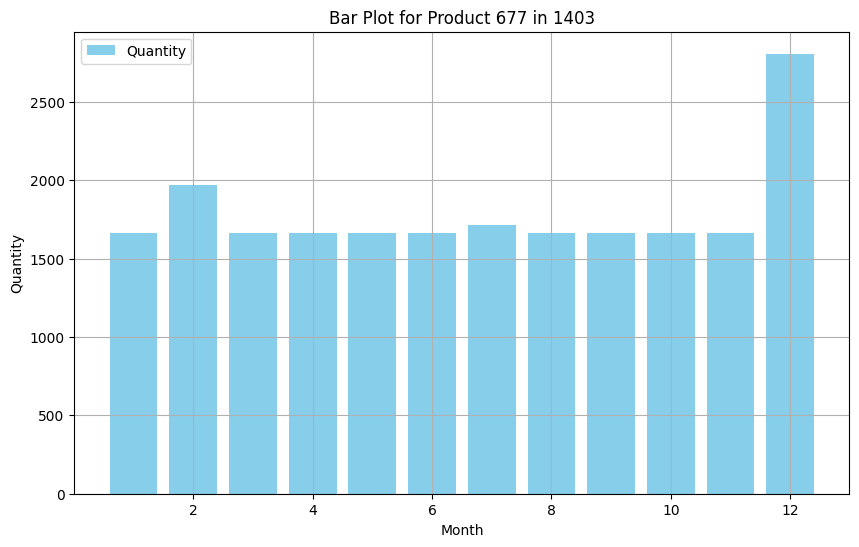

In [98]:
plt.figure(figsize=(10, 6))
plt.bar(df_1403['PersianMonthNo'], df_1403['InvoiceItemQuantity'], color='skyblue', label='Quantity')
plt.title('Bar Plot for Product 677 in 1403')
plt.xlabel('Month')
plt.ylabel('Quantity')
plt.legend()
plt.grid(True)
plt.show()

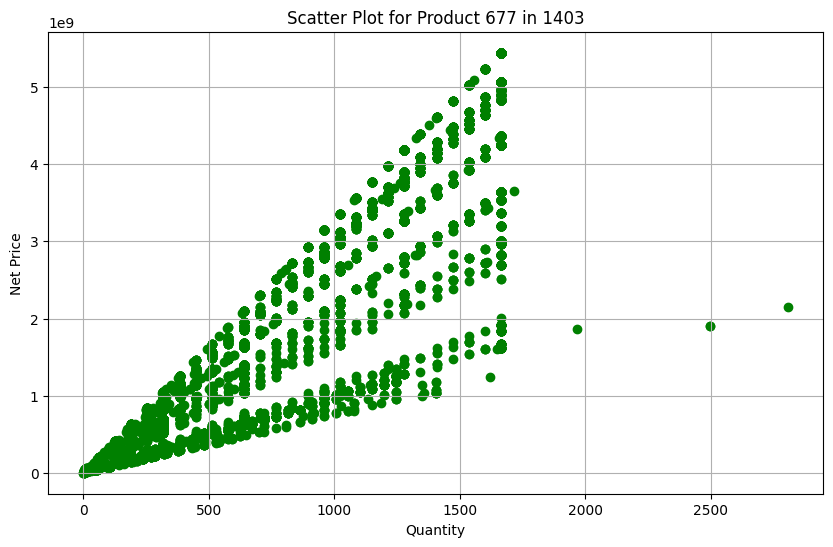

In [99]:
plt.figure(figsize=(10, 6))
plt.scatter(df_1403['InvoiceItemQuantity'], df_1403['NetPrice'], color='green')
plt.title('Scatter Plot for Product 677 in 1403')
plt.xlabel('Quantity')
plt.ylabel('Net Price')
plt.grid(True)
plt.show()

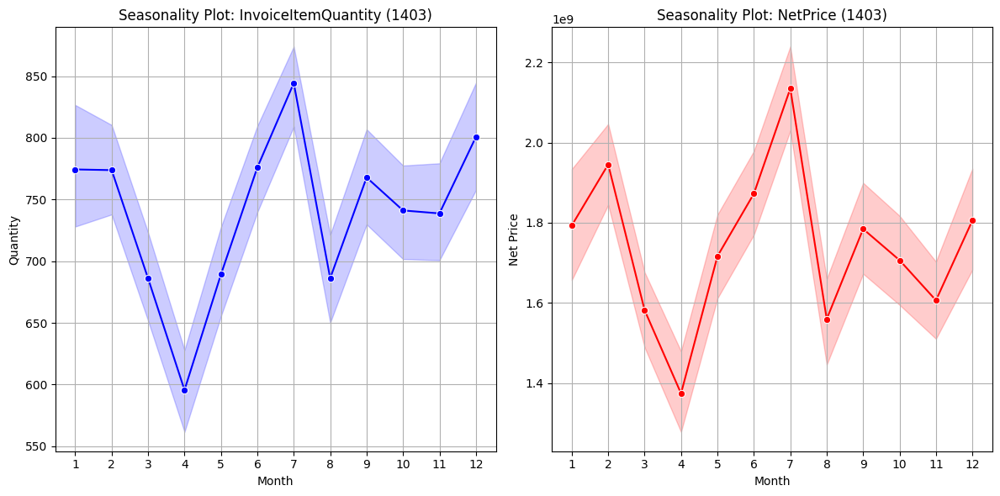

In [100]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.lineplot(x='PersianMonthNo', y='InvoiceItemQuantity', data=df_1403, marker='o', color='blue')
plt.title('Seasonality Plot: InvoiceItemQuantity (1403)')
plt.xlabel('Month')
plt.ylabel('Quantity')
plt.xticks(range(1, 13))
plt.grid(True)


plt.subplot(1, 2, 2)
sns.lineplot(x='PersianMonthNo', y='NetPrice', data=df_1403, marker='o', color='red')
plt.title('Seasonality Plot: NetPrice (1403)')
plt.xlabel('Month')
plt.ylabel('Net Price')
plt.xticks(range(1, 13))
plt.grid(True)

plt.tight_layout()
plt.show()

In [101]:

monthly_agg = df_1403.groupby('PersianMonthNo').agg({
    'InvoiceItemQuantity': 'mean',
    'NetPrice': 'mean'
}).reset_index()

fig1 = px.bar(monthly_agg, x='PersianMonthNo', y='InvoiceItemQuantity',
              title='Monthly Aggregated Seasonality: Quantity (1403)',
              labels={'PersianMonthNo': 'Month', 'InvoiceItemQuantity': 'Average Quantity'})

fig1.update_layout(
    xaxis=dict(tickvals=list(range(1, 13))))
fig1.show()


fig2 = px.bar(monthly_agg, x='PersianMonthNo', y='NetPrice',
              title='Monthly Aggregated Seasonality: Net Price (1403)',
              labels={'PersianMonthNo': 'Month', 'NetPrice': 'Average Net Price'})

fig2.update_layout(
    xaxis=dict(tickvals=list(range(1, 13))))
fig2.show()


In [102]:

def get_season(month):
    if 1 <= month <= 3:
        return 'Spring'
    elif 4 <= month <= 6:
        return 'Summer'
    elif 7 <= month <= 9:
        return 'Autumn'
    else:
        return 'Winter'

df_1403['Season'] = df_1403['PersianMonthNo'].apply(get_season)

<ipython-input-102-f602d6a895c2>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [103]:

fig1 = px.line(df_1403, x='PersianMonthNo', y='InvoiceItemQuantity', color='Season',
               title='Seasonal Line Plot: InvoiceItemQuantity (1403)',
               labels={'PersianMonthNo': 'Month', 'InvoiceItemQuantity': 'Quantity'})
fig1.show()

fig2 = px.line(df_1403, x='PersianMonthNo', y='NetPrice', color='Season',
               title='Seasonal Line Plot: NetPrice (1403)',
               labels={'PersianMonthNo': 'Month', 'NetPrice': 'Net Price'})
fig2.show()

In [104]:

seasonal_agg = df_1403.groupby('Season').agg({
    'InvoiceItemQuantity': 'mean',
    'NetPrice': 'mean'
}).reset_index()

fig1 = px.bar(seasonal_agg, x='Season', y='InvoiceItemQuantity',
              title='Seasonal Bar Plot: Average InvoiceItemQuantity (1403)',
              labels={'Season': 'Season', 'InvoiceItemQuantity': 'Average Quantity'})
fig1.show()
fig2 = px.bar(seasonal_agg, x='Season', y='NetPrice',
              title='Seasonal Bar Plot: Average NetPrice (1403)',
              labels={'Season': 'Season', 'NetPrice': 'Average Net Price'})
fig2.show()

In [105]:

fig1 = px.box(df_1403, x='Season', y='InvoiceItemQuantity',
              title='Seasonal Box Plot: InvoiceItemQuantity (1403)',
              labels={'Season': 'Season', 'InvoiceItemQuantity': 'Quantity'})
fig1.show()

fig2 = px.box(df_1403, x='Season', y='NetPrice',
              title='Seasonal Box Plot: NetPrice (1403)',
              labels={'Season': 'Season', 'NetPrice': 'Net Price'})
fig2.show()